## Project Overview
This is a project made for a further understanding about YOLOv8 and model quantization in the traffic density detection problem.  

The reason for choosing YOLOv8:
- It is designed for tasks like classification, object detection, and image segmentation, YOLOv8 outshines its predecessor, YOLOv7, in both precision and speed. 
- By utilizing Darknet53 as its backbone, it employs more feature maps and efficient convolutional neural networks, resulting in higher mAP and fps. 
- YOLOv8 introduces an innovative anchor-free detection head, enabling pixel-wise bounding box estimations akin to image segmentation techniques, and incorporates a new loss function. This culmination of features achieves a mean Average Precision of 53.7% on the COCO benchmark dataset, marking YOLOv8 as a state-of-the-art model in object detection.

## Section Overview
1. Setup environment 
2. Dataset exploration
3. Fine-tune the YOLOv8 model
4. Model quantization (post-training)

## 1. Setup environment
Import all necessary libraries for the project:

In [2]:
# Disable warnings in the notebook to maintain clean output cells
import warnings
warnings.filterwarnings('ignore')

import os
import shutil
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import yaml
import kagglehub
from PIL import Image
from ultralytics import YOLO
from IPython.display import Video


## 2. Dataset exploration

Overview about the dataset:

First we need to download the dataset using `kagglehub`

In [10]:
# Download latest version
dataset_path = kagglehub.dataset_download("farzadnekouei/top-view-vehicle-detection-image-dataset")
dataset_path = os.path.join(dataset_path, "Vehicle_Detection_Image_Dataset")

yaml_path = os.path.join(dataset_path, "data.yaml")

# Load the yaml file
with open(yaml_path, 'r') as file:
    yaml_content = yaml.load(file, Loader=yaml.FullLoader)
    print(yaml.dump(yaml_content, default_flow_style=False))

names:
- Vehicle
nc: 1
roboflow:
  license: CC BY 4.0
  project: vehicle_detection_yolov8
  url: https://universe.roboflow.com/farzad/vehicle_detection_yolov8/dataset/3
  version: 3
  workspace: farzad
train: ../train/images
val: ../valid/images



The yaml file provide us the path to train and val images folder

We explore the structure of the images in the dataset 

In [3]:
train_img_path = os.path.join(dataset_path, "train", "images")
val_img_path = os.path.join(dataset_path, "valid", "images")

print(f"Number of training images: {len(os.listdir(train_img_path))}")
print(f"Number of validation images: {len(os.listdir(val_img_path))}")

# Use a set to check if all images have the same size
train_img_sizes = set()
val_img_sizes = set()

# Check the sizes of the images
for f in os.listdir(train_img_path):
    with Image.open(os.path.join(train_img_path, f)) as img:
        train_img_sizes.add(img.size)

for f in os.listdir(val_img_path):
    with Image.open(os.path.join(val_img_path, f)) as img:
        val_img_sizes.add(img.size)

print(f"Training image sizes: {train_img_sizes}")
print(f"Validation image sizes: {val_img_sizes}")

Number of training images: 536
Number of validation images: 90
Training image sizes: {(640, 640)}
Validation image sizes: {(640, 640)}


From the output above, we can conclude that all images in the dataset have the same size

We can use `matplotlib` to plot some images in the dataset to see what the data look like

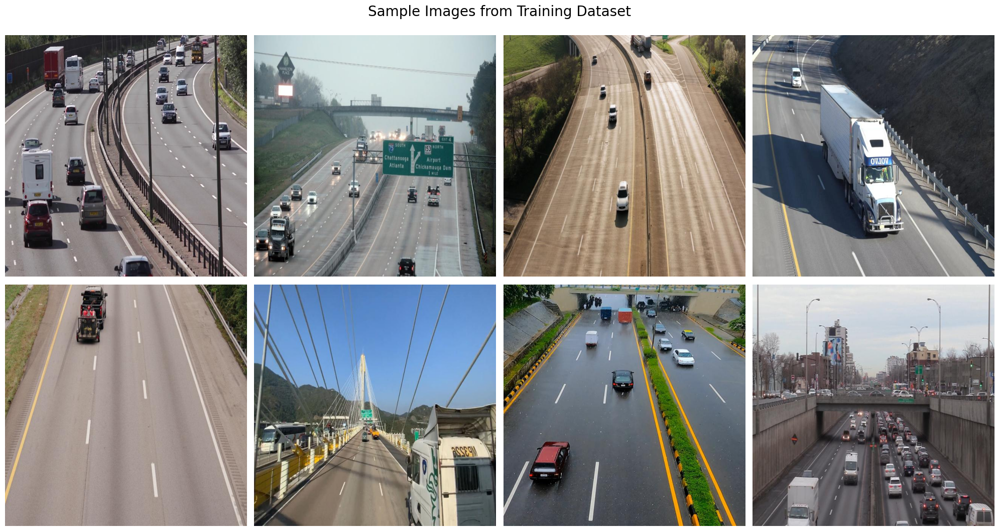

In [4]:
# List all jpg images in the directory
image_files = [file for file in os.listdir(train_img_path)]

# Select 8 images at equal intervals
num_images = len(image_files)
selected_images = [image_files[i] for i in range(0, num_images, num_images // 8)]

# Create a 2x4 subplot
fig, axes = plt.subplots(2, 4, figsize=(20, 11))

# Display images
for ax, img_file in zip(axes.ravel(), selected_images):
    img_path = os.path.join(train_img_path, img_file)
    image = Image.open(img_path)
    ax.imshow(image)
    ax.axis('off')  

plt.suptitle('Sample Images from Training Dataset', fontsize=20)
plt.tight_layout()
plt.show()

## 3. Fine-tune the YOLOv8 model

First, we need to load the pretrained YOLOv8 model

In [5]:
model = YOLO('yolov8n.pt')

This will leverage the weights that existed from YOLOv8 nano model to save more training time 

In [6]:
# Train the model on our custom dataset
results = model.train(
    data=yaml_path,     # Path to the dataset configuration file
    epochs=100,              # Number of epochs to train for
    imgsz=640,               # Size of input images as integer
    device=0,                # Device to run on, i.e. cuda device=0 
    patience=50,             # Epochs to wait for no observable improvement for early stopping of training
    batch=16,                # Number of images per batch
    optimizer='AdamW',        # Optimizer to use, choices=[SGD, Adam, Adamax, AdamW, NAdam, RAdam, RMSProp, auto]
    lr0=0.0001,              # Initial learning rate 
    lrf=0.1,                 # Final learning rate (lr0 * lrf)
    dropout=0.1,             # Use dropout regularization
    seed=0                   # Random seed for reproducibility
)

Ultralytics 8.3.241  Python-3.10.0 torch-2.7.1+cu118 CUDA:0 (NVIDIA GeForce RTX 3050 Laptop GPU, 4096MiB)
engine\trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=C:\Users\Admin\.cache\kagglehub\datasets\farzadnekouei\top-view-vehicle-detection-image-dataset\versions\2\Vehicle_Detection_Image_Dataset\data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.1, dynamic=False, embed=None, epochs=100, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.0001, lrf=0.1, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, n

In [4]:
# Define a function to plot learning curves for loss values
def plot_learning_curve(df, train_loss_col, val_loss_col, title):
    plt.figure(figsize=(12, 5))
    sns.lineplot(data=df, x='epoch', y=train_loss_col, label='Train Loss', color='#141140', linestyle='-', linewidth=2)
    sns.lineplot(data=df, x='epoch', y=val_loss_col, label='Validation Loss', color='orangered', linestyle='--', linewidth=2)
    plt.title(title)
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

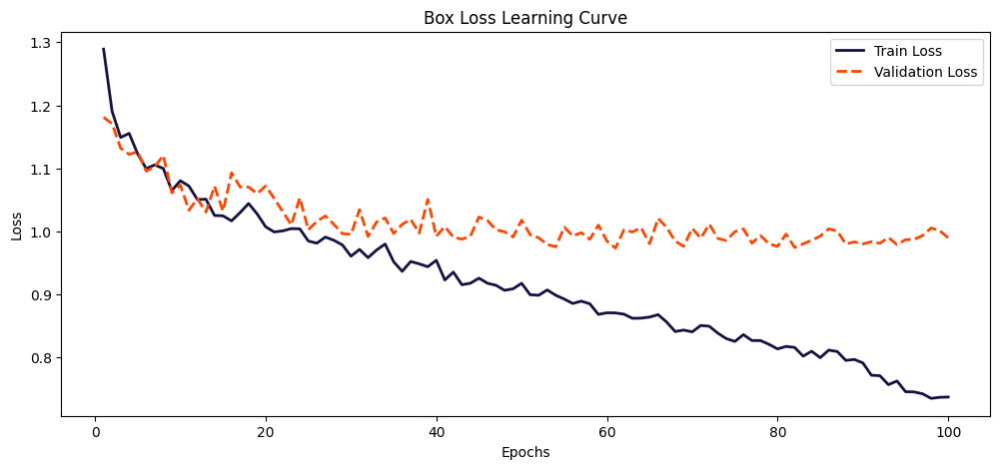

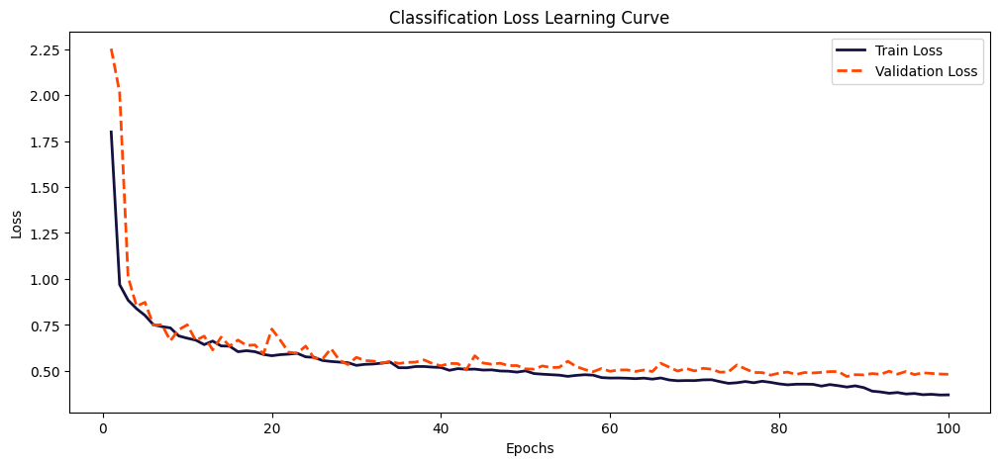

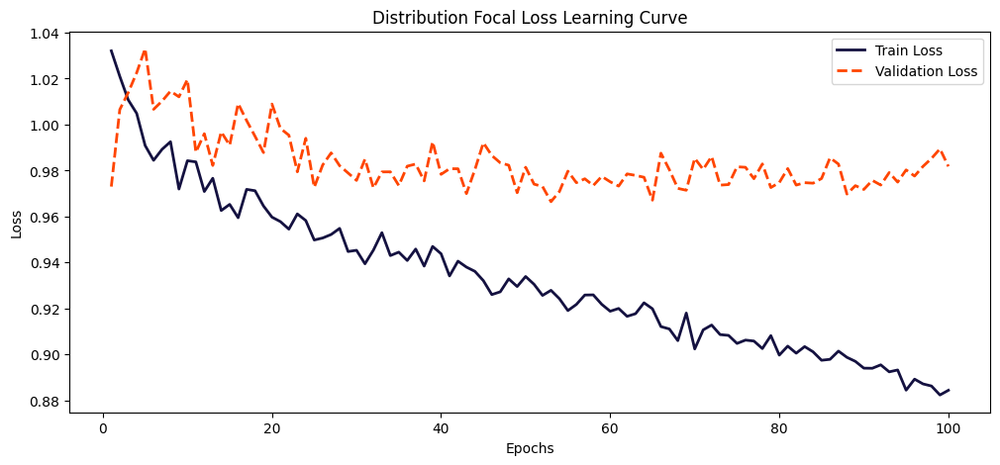

In [5]:
result_path = os.path.join("runs", "detect", "train6")

csv_path = os.path.join(result_path, "results.csv")
df = pd.read_csv(csv_path)

# Remove any leading whitespace from the column names
df.columns = df.columns.str.strip()

# Plot the learning curves for each loss
plot_learning_curve(df, 'train/box_loss', 'val/box_loss', 'Box Loss Learning Curve')
plot_learning_curve(df, 'train/cls_loss', 'val/cls_loss', 'Classification Loss Learning Curve')
plot_learning_curve(df, 'train/dfl_loss', 'val/dfl_loss', 'Distribution Focal Loss Learning Curve')

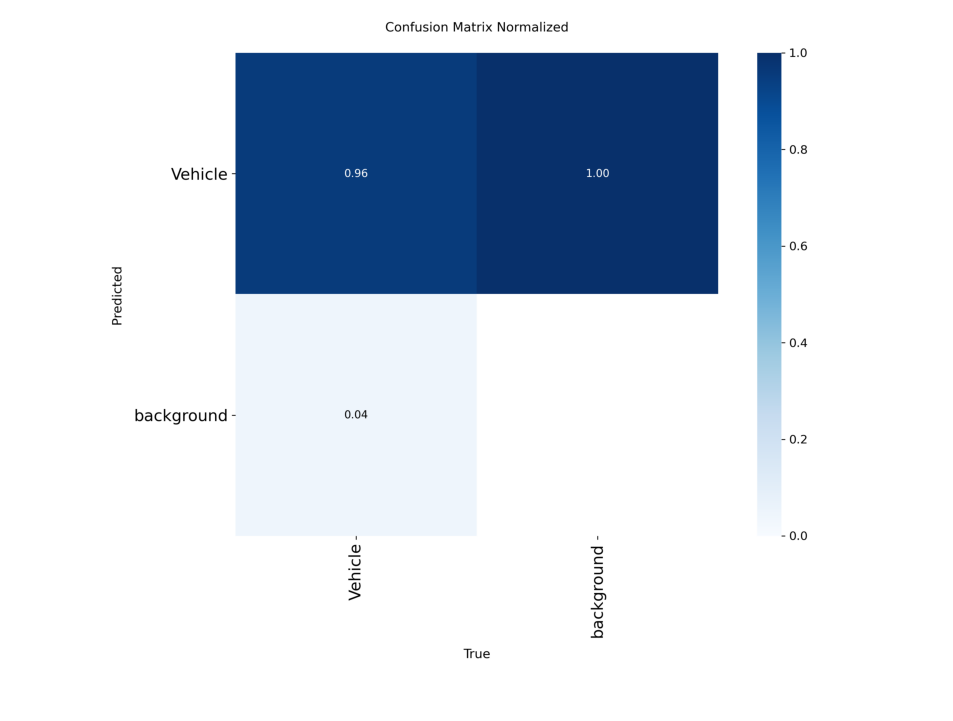

In [6]:
# Construct the path to the normalized confusion matrix image
confusion_matrix_path = os.path.join(result_path, 'confusion_matrix_normalized.png')

# Read the image using cv2
cm_img = cv2.imread(confusion_matrix_path)

# Convert the image from BGR to RGB color space for accurate color representation with matplotlib
cm_img = cv2.cvtColor(cm_img, cv2.COLOR_BGR2RGB)

# Display the image
plt.figure(figsize=(10, 10), dpi=120)
plt.imshow(cm_img)
plt.axis('off') 
plt.show()

In [7]:
# Construct the path to the best model weights file using os.path.join
best_model_path = os.path.join(result_path, 'weights/best.pt')

# Load the best model weights into the YOLO model
best_model = YOLO(best_model_path)

# Validate the best model using the validation set with default parameters
metrics = best_model.val(split='val')

Ultralytics 8.3.241  Python-3.10.0 torch-2.7.1+cu118 CUDA:0 (NVIDIA GeForce RTX 3050 Laptop GPU, 4096MiB)
Model summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access  (ping: 0.10.0 ms, read: 184.637.6 MB/s, size: 54.3 KB)
val: Scanning C:\Users\Admin\.cache\kagglehub\datasets\farzadnekouei\top-view-vehicle-detection-image-dataset\versions\2\Vehicle_Detection_Image_Dataset\valid\labels.cache... 90 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 90/90 91.5Kit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 6/6 3.9it/s 1.5s0.2s
                   all         90        937      0.927      0.923      0.971      0.737
Speed: 2.8ms preprocess, 7.1ms inference, 0.0ms loss, 3.0ms postprocess per image
Results saved to D:\QUOCLAN\code\quantz\runs\detect\val


In [8]:
metrics_df = pd.DataFrame.from_dict(metrics.results_dict, orient='index', columns=['Metric Value'])

# Display the DataFrame
metrics_df.round(3)

,Metric Value
metrics/precision(B),0.927
metrics/recall(B),0.923
metrics/mAP50(B),0.971
metrics/mAP50-95(B),0.737
fitness,0.737



image 1/1 C:\Users\Admin\.cache\kagglehub\datasets\farzadnekouei\top-view-vehicle-detection-image-dataset\versions\2\Vehicle_Detection_Image_Dataset\valid\images\10_mp4-0_jpg.rf.08b3bd34bbb73fb80c2d662c34474a98.jpg: 640x640 20 Vehicles, 58.3ms
Speed: 10.6ms preprocess, 58.3ms inference, 4.2ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 C:\Users\Admin\.cache\kagglehub\datasets\farzadnekouei\top-view-vehicle-detection-image-dataset\versions\2\Vehicle_Detection_Image_Dataset\valid\images\11_mp4-15_jpg.rf.b1bdb8b4864b5bed3c78f1a70e2dc011.jpg: 640x640 13 Vehicles, 58.3ms
Speed: 5.5ms preprocess, 58.3ms inference, 3.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 C:\Users\Admin\.cache\kagglehub\datasets\farzadnekouei\top-view-vehicle-detection-image-dataset\versions\2\Vehicle_Detection_Image_Dataset\valid\images\12_mp4-27_jpg.rf.2b272befa75f6ccd269223ccc84e5391.jpg: 640x640 4 Vehicles, 52.9ms
Speed: 5.1ms preprocess, 52.9ms inference, 3.3ms postprocess per imag

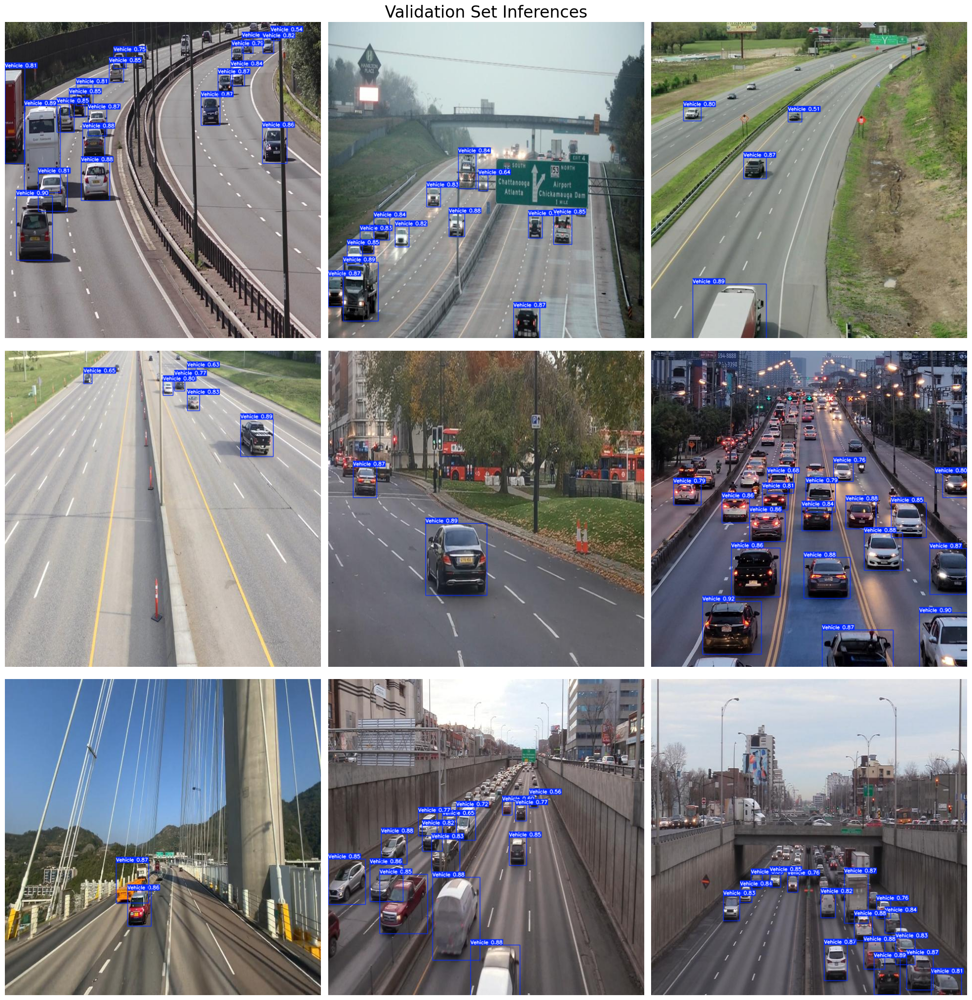

In [11]:
# Define the path to the validation images
valid_images_path = os.path.join(dataset_path, 'valid', 'images')

# List all jpg images in the directory
image_files = [file for file in os.listdir(valid_images_path) if file.endswith('.jpg')]

# Select 9 images at equal intervals
num_images = len(image_files)
selected_images = [image_files[i] for i in range(0, num_images, num_images // 9)]

# Initialize the subplot
fig, axes = plt.subplots(3, 3, figsize=(20, 21))
fig.suptitle('Validation Set Inferences', fontsize=24)

# Perform inference on each selected image and display it
for i, ax in enumerate(axes.flatten()):
    image_path = os.path.join(valid_images_path, selected_images[i])
    results = best_model.predict(source=image_path, imgsz=640, conf=0.5)
    annotated_image = results[0].plot(line_width=1)
    annotated_image_rgb = cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB)
    ax.imshow(annotated_image_rgb)
    ax.axis('off')

plt.tight_layout()
plt.show()